## Instalar las librerías necesarias en el entorno

In [10]:
%pip install ydata-profiling
%pip install pandas
%pip install numpy
%pip install matplotlib
%pip install seaborn
%pip install plotly
%pip install scikit-learn
%pip install ipywidgets

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 6.7 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [ipywidgets]3 [ipywidgets]widgets]
Note: you may need to restart the kernel to use updated packages.


# Análisis Exploratorio de datos (EDA) - Dataset de Música

Realizaremos un análisis exploratorio completo del dataset de música utilizando ydata-profiling y visualizaciones adicionales para entender mejor los datos y su distribución.

In [5]:
%matplotlib inline

In [6]:
# Importación de librerías necesarias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport
import plotly.express as px
import plotly.graph_objects as go

# Configuración de visualización
plt.style.use('ggplot')
sns.set_palette('husl')
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['font.size'] = 12

/mnt/c/Users/Usuario/Documents/GitHub/Oracle_Songs_ML/.conda/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [7]:
# Carga del dataset
df = pd.read_csv('train.csv')

# Visualización de las primeras filas
print("Dimensiones del dataset:", df.shape)
df.head()

Dimensiones del dataset: (114000, 21)


,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [8]:
df.keys()

Index(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name',
       'popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre'],
      dtype='object')

## 1. Análisis general con ydata-profiling

Utilizaremos `ydata-profiling` para obtener un análisis detallado y automático del dataset.

In [11]:
# Generación del reporte de perfil
profile = ProfileReport(df, title="Análisis Exploratorio de Datos")
profile.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:07<00:00,  7.85s/it]


## 2. Análisis de Distribución de Canciones

Analizaremos la distribución de las canciones según su popularidad y género.

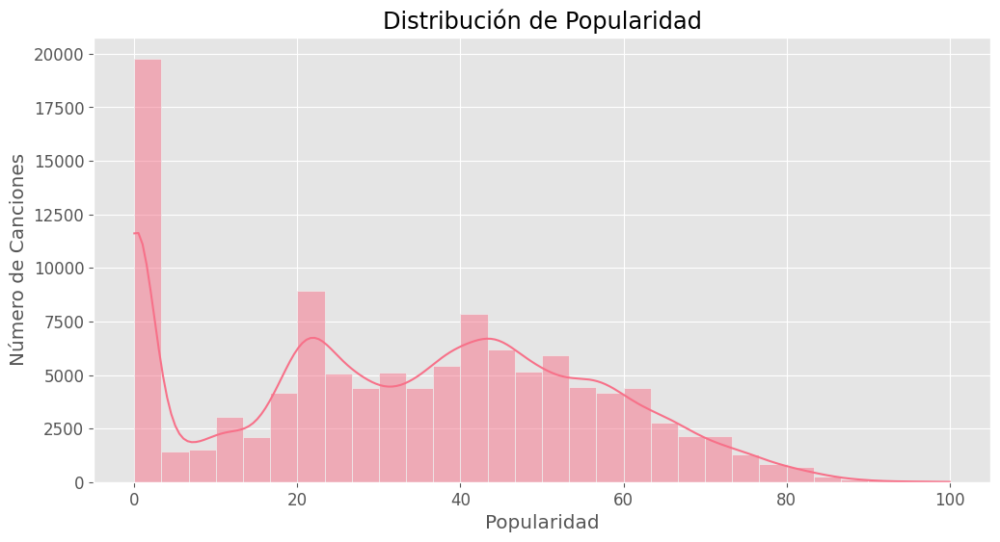

In [12]:
# Distribución de popularidad
plt.figure(figsize=(12, 6))
sns.histplot(data=df, x='popularity', bins=30, kde=True)
plt.title('Distribución de Popularidad')
plt.xlabel('Popularidad')
plt.ylabel('Número de Canciones')
plt.show()

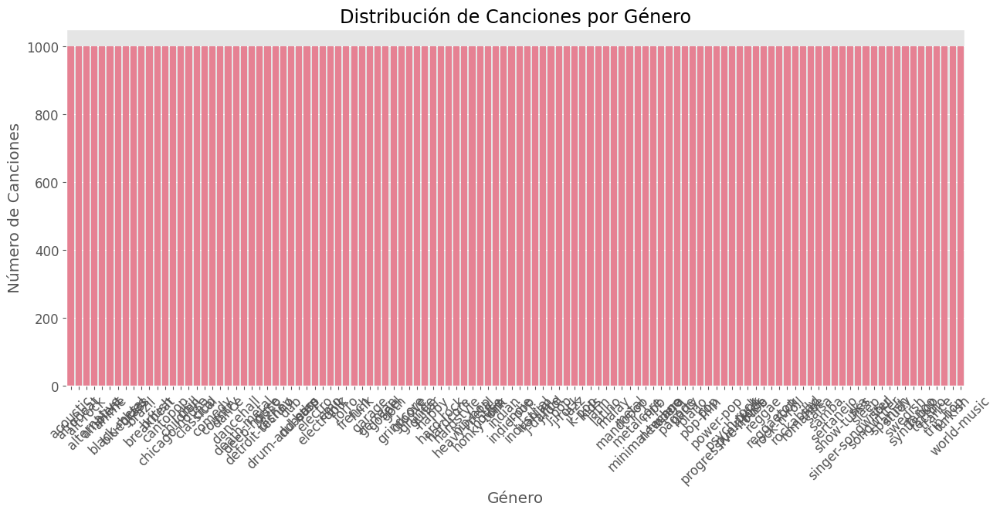

In [13]:
# Distribución de canciones por género
plt.figure(figsize=(15, 6))
genre_counts = df['track_genre'].value_counts()
sns.barplot(x=genre_counts.index, y=genre_counts.values)
plt.title('Distribución de Canciones por Género')
plt.xlabel('Género')
plt.ylabel('Número de Canciones')
plt.xticks(rotation=45)
plt.show()

## 3. Análisis de Características

Analizaremos qué variables pueden ser más útiles para nuestro modelo de machine learning.

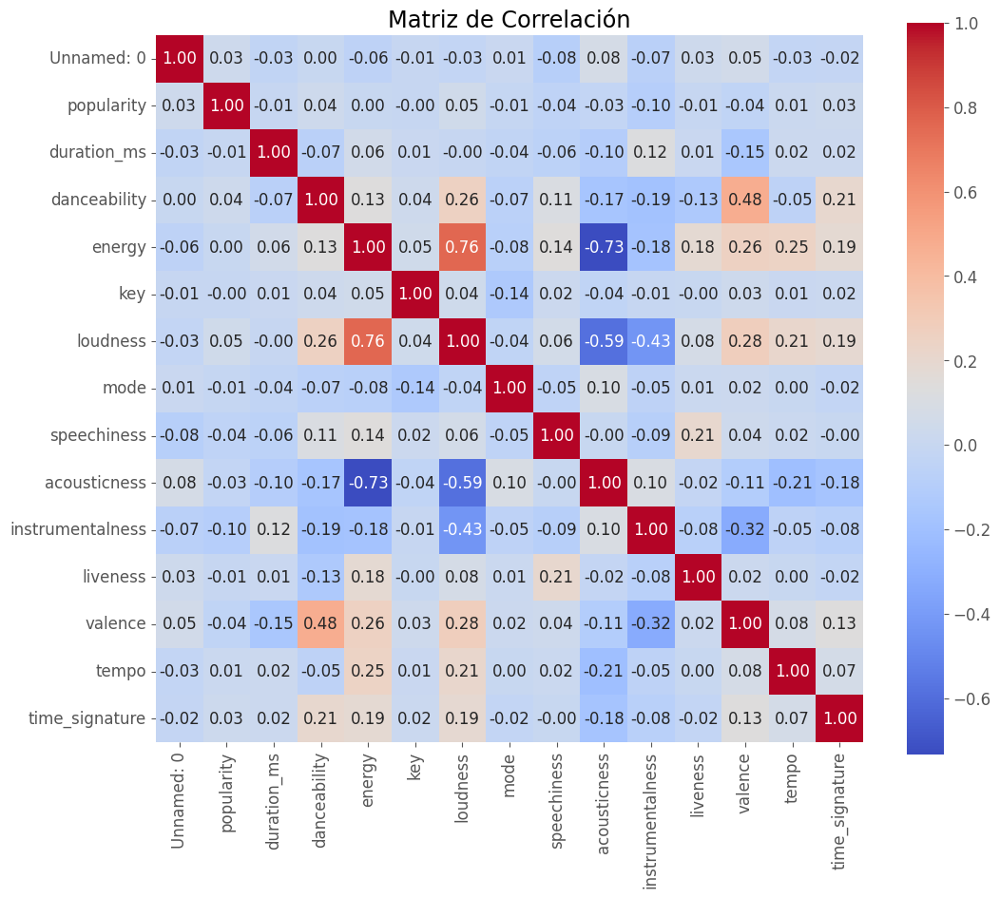

In [14]:
# Matriz de correlación de características
numeric_features = df.select_dtypes(include=[np.number]).columns
correlation_matrix = df[numeric_features].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Matriz de Correlación')
plt.show()